In [1]:
%load_ext autoreload 
%autoreload 2

# Example notebook for DIP ptycho of the MOSS-6 dataset

This notebook walks through an end-to-end ptychography workflow on an extremely dose-sensitive MOF dataset:

1. Load and calibrate raw 4D-STEM data
2. Screen and optimize acquisition/probe parameters using direct methods
3. Run iterative ptychography (pixelated warm start, then DIP refinement)
4. Compare Fourier-space transfer and export reconstruction outputs


Data is from the paper by [Li et al. (2025)](https://www.nature.com/articles/s41467-025-56215-z#data-availability) and the `emdatabase` package is used to download it from the [Zenodo repository](https://zenodo.org/records/13958144).

The reconstruction methods here are more fully explained in [our paper](https://arxiv.org/abs/2511.07795).

Arthur McCray, Georgios Varnavides  
Last updated: September 17, 2026

In [2]:
from pathlib import Path

import numpy as np
import quantem as em
import torch
from emdatabase import data
from quantem.core import config
from quantem.core.ml import CNN2d, OptimizerParams, SchedulerParams
from quantem.core.utils.diffractive_imaging_utils import fit_probe_circle
from quantem.core.visualization import ShowParams, show_2d
from quantem.diffractive_imaging import (
    DetectorPixelated,
    ObjectDIP,
    ObjectPixelated,
    ProbeDIP,
    ProbePixelated,
    PtychoDatasetConstraintParams,
    Ptychography,
    PtychographyDatasetRaster,
    PtychoObjConstraintParams,
)
from quantem.diffractive_imaging.direct_ptychography import OptimizationParameter

print(f"quantEM version: {em.__version__}")

GPU_ID = 0
config.set_device(GPU_ID)
print(f"Using GPU {config.get('device')}")

quantEM version: 0.1.9
Using GPU cuda:0


## Import and visualize data

Start by defining the experimental constants we will rely on throughout this workflow.

Even when partial metadata exists in the microscope file, it is good practice to explicitly set critical values in the notebook so reconstruction settings are auditable and reproducible:

- probe energy
- probe semi-convergence angle
- estimated defocus
- scan step size

In [3]:
PROBE_ENERGY = 300e3
PROBE_SEMIANGLE = 10 # mrad 
PROBE_DEFOCUS = 885 # A 
SCAN_STEP_SIZE = 1.051 # A 

In [4]:
emdata = data.MOSS6Fig3()
fdata = emdata.download(background=False)
fdata

<DatasetPath '/home/amccray/.cache/emdatabase/MOSS6Fig3/acquisition_12.xml' [done]>

In [5]:
dset = em.io.read_4dstem(
    fdata,
    file_type='empad',
)
dset.array = np.transpose(dset.array, (0,1,3,2)).clip(0)
dset

Available datasets:
  Dataset 0: shape (256, 256, 128, 128), ndim=4
Using first 4D dataset at index 0 with shape (256, 256, 128, 128)


Dataset(shape=(256, 256, 128, 128), dtype=float32, name='4D-STEM dataset')
  sampling: [107.48881829 107.48881829   1.           1.        ]
  units: ['pm', 'pm', 'None', 'None']
  signal units: 'arb. units'

Notice that not all microscope metadata is populated automatically.

This is common across 4D-STEM detector formats: different systems write scan calibration, reciprocal calibration, and aberration metadata differently (or more often omit it).

In [5]:
dset.sampling = (SCAN_STEP_SIZE, SCAN_STEP_SIZE, 1, 1)
dset.units=("A", "A", "pixels", "pixels")
dset

Dataset(shape=(256, 256, 128, 128), dtype=float32, name='4D-STEM dataset')
  sampling: [1.051 1.051 1.    1.   ]
  units: ['A', 'A', 'pixels', 'pixels']
  signal units: 'arb. units'

This sample is MOSS6 (a metal-organic framework, MOF).

It is highly beam-sensitive, and this dataset was collected at roughly `~100 e/A^2` total dose. That low-dose regime is exactly where phase-sensitive methods (direct + iterative ptychography) become important: conventional virtual BF/DF contrast is often weak, but phase reconstruction can still recover useful structure.

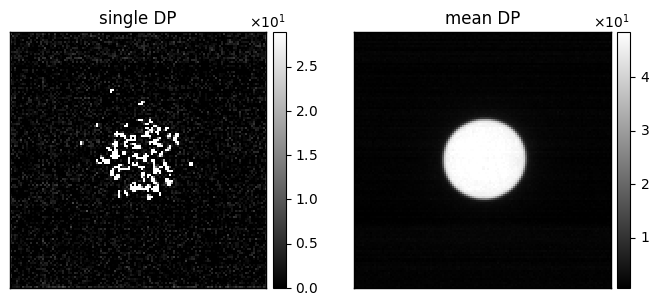

In [6]:
dset.get_dp_mean() # this computes the mean, we can then access is as dset.dp_mean

show_2d(
    [
        dset[0,0].array,
        dset.dp_mean,
    ],
    titles=[
        "single DP",
        "mean DP",
    ],
    cbar=True,
);

Most experimental 4D-STEM datasets contain hot pixels or small detector defects.

Those outliers can bias COM estimates and iterative loss terms, so it is worth checking before reconstruction. Here we show optional cleanup utilities, but this specific dataset does not need additional filtering.

In [7]:
# from quantem.core.utils.filter import filter_hot_pixels, median_filter

# show_2d(dset.dp_mean.array, title="mean dp before filtering", cbar=True, norm='minmax')

# bad_pixel_mask = flatfield.array.mean((0,1))>40 # if you have a flatfield image, or you can just use the mean 
# dset.array = median_filter(dset.array, mask=bad_pixel_mask, size=10, axes=(-2,-1))

# ### alternatively
# dset.array = filter_hot_pixels(dset.array)

# dset.get_dp_mean()
# dset.get_dp_max()
# show_2d(dset.dp_mean.array, title="mean dp after filtering", cbar=True, norm='minmax')

### Detector calibration from the direct beam

A critical step is calibrating the detector sampling (`mrad` or `A^-1`) using the direct beam and the known convergence semiangle. 

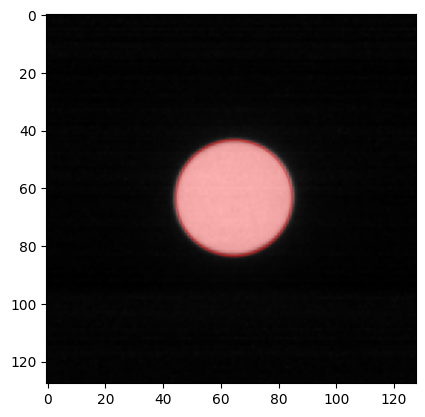

quantem Dataset named '4D-STEM dataset'
  shape: (256, 256, 128, 128)
  dtype: float32
  device: cpu
  origin: [  0.   0. -64. -64.]
  sampling: [1.051      1.051      0.49534808 0.49534808]
  units: ['A', 'A', 'mrad', 'mrad']
  signal units: 'arb. units'


In [8]:
probe_qy0, probe_qx0, probe_R = fit_probe_circle(dset.dp_mean.array, show=True)
dset.sampling[2] = PROBE_SEMIANGLE / probe_R
dset.sampling[3] = PROBE_SEMIANGLE / probe_R
dset.units[2:] = ["mrad", "mrad"]
probe_R = PROBE_SEMIANGLE / dset.sampling[2]
print(dset)

With scan and detector calibration set, we can generate quick virtual images to sanity-check contrast. It is especially useful for checking field of view and knowing where to potentially crop the data in realspace for faster reconstructions. 

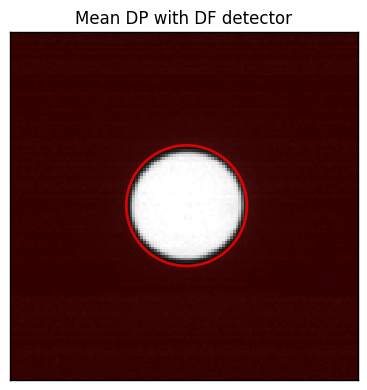

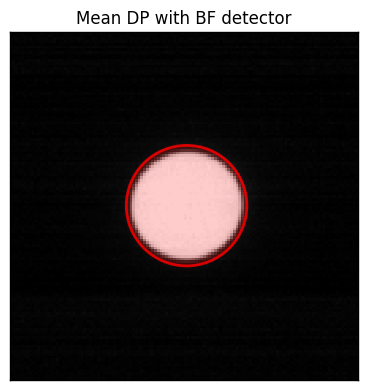

Dataset(shape=(256, 256), dtype=float32, name='BF')
  sampling: [1.051 1.051]
  units: ['A', 'A']
  signal units: 'arb. units'

In [9]:
dset.get_virtual_image(
    mode="annular",
    geometry=((probe_qy0, probe_qx0), (probe_R+2, probe_R*5)), 
    name="DF",
    show=True,
)

dset.get_virtual_image(
    mode="circle", 
    geometry=((probe_qy0, probe_qx0), probe_R+2), 
    name="BF",
    show=True,
)

(256, 256, 128, 128)


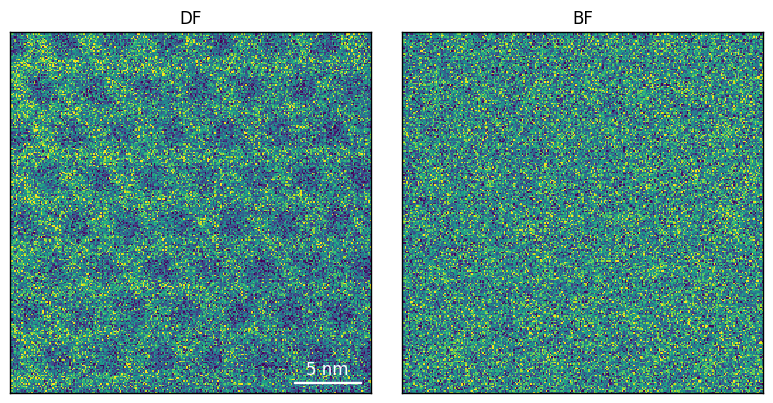

In [10]:
dset.show_virtual_images(cmap='viridis')
print(dset.shape)

As expected for a weakly scattering, low-dose sample, the virtual images are not very informative.

This is a common ptychography use case: diffraction data still contains phase information even when direct intensity contrast is poor. Next we use direct ptychography methods to extract phase-sensitive signal and tune key parameters before iterative reconstruction.

## Direct ptychography

Iterative methods are powerful but expensive and sensitive to initialization. Before committing to long iterative runs, we first use direct methods to:

- quickly evaluate whether the dataset is reconstructable
- compare multiple phase-contrast reconstructions
- tune aberration and rotation parameters for better iterative initialization

In practice this screening step saves significant time: if direct methods fail completely, iterative reconstructions are often unstable or low quality without additional calibration/debugging.

In [11]:
direct_ptycho = em.diffractive_imaging.DirectPtychography.from_dataset4d(
    dset,
    energy=PROBE_ENERGY,
    semiangle_cutoff=PROBE_SEMIANGLE,
    aberration_coefs={"defocus":PROBE_DEFOCUS},
    device='gpu',
    max_batch_size=2**8,
)

There are several direct reconstruction formulations available in quantEM/4D-STEM workflows.

For this defocused-probe experiment, the most informative are usually:

- SSB (single-sideband direct ptychography)
- Parallax / tcBF-style reconstructions

We compare multiple kernels first, then optimize aberration coefficients and scan rotation using the direct-method objective. The optimized parameters are then carried into iterative ptychography.

For more background, see George's paper: https://arxiv.org/abs/2507.18610
and the direct ptycho tutorials: https://github.com/electronmicroscopy/quantem-tutorials/tree/main/tutorials/diffractive_imaging

  0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 5/5 [00:01<00:00,  4.10it/s]


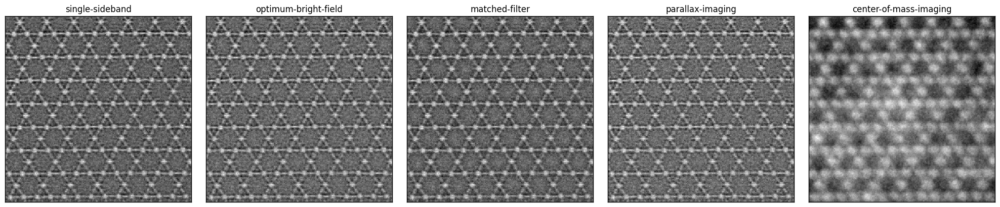

In [12]:
recons = direct_ptycho._reconstruct_all_permutations(upsampling_factor=1)

titles = ["single-sideband","optimum-bright-field","matched-filter","parallax-imaging","center-of-mass-imaging"]
show_2d(
    recons,
    title=titles,
    norm="minmax", 
    axsize=(4,4),
);

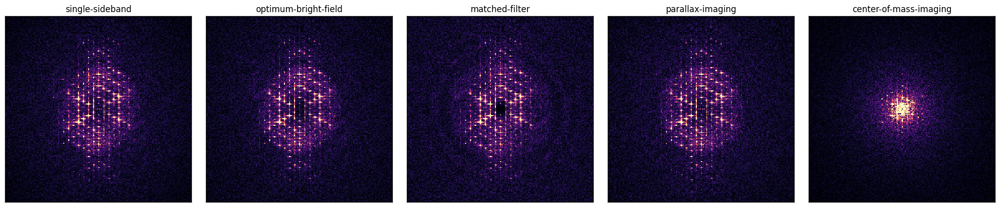

In [13]:
fft_recons = [np.fft.fftshift(np.abs(np.fft.fft2(recon))) for recon in recons]

show_2d(
    fft_recons,
    title=titles,
    cmap='magma', 
    upper_quantile=0.995,
    axsize=(4,4),
);

In [14]:
# Optimize aberrations and rotation with optuna
direct_ptycho = direct_ptycho.optimize_hyperparameters(
    aberration_coefs={
        "C10":OptimizationParameter(
            -1.5*PROBE_DEFOCUS,
            -0.5*PROBE_DEFOCUS,
        ),
        "C12":OptimizationParameter(0,300),
        "phi12":OptimizationParameter(-np.pi/2, np.pi/2)
    },
    rotation_angle=OptimizationParameter(
        direct_ptycho.rotation_angle - 0.2, 
        direct_ptycho.rotation_angle + 0.2
    ),
    n_trials=100,
    deconvolution_kernel='parallax',
)

Best trial: 94. Best value: 1.80635e-06: 100%|██████████| 100/100 [00:20<00:00,  4.88it/s]


Optimized state:

 HyperparameterState(
  initial_aberrations={'C10': -885.0},
  initial_rotation_angle_deg=88.0,
  optimized_aberrations={'C10': -1052.510153977838, 'C12': 139.42045477536746, 'phi12': -0.5330638565505849},
  optimized_rotation_angle_deg=88.08010540392696,
)


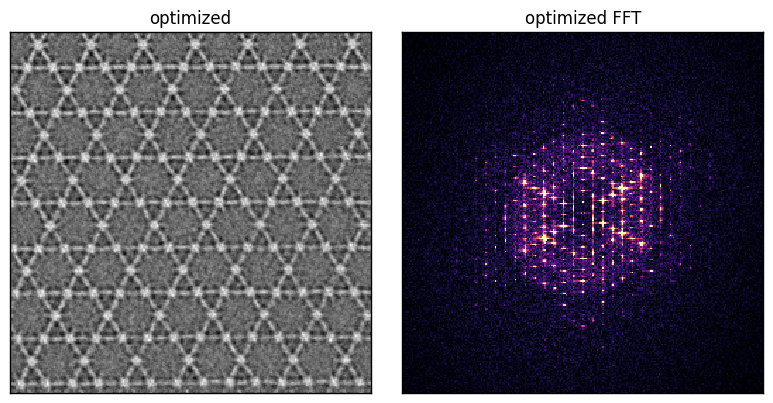

In [15]:
optimized_recon = direct_ptycho.reconstruct(
    deconvolution_kernel='ssb',
    upsampling_factor=1,
    verbose=False,
).obj
optimized_recon_fft = np.fft.fftshift(np.abs(np.fft.fft2(optimized_recon)))
show_2d(
    [
        optimized_recon,
        optimized_recon_fft,
    ],
    title=["optimized","optimized FFT"],
    cmap=['grey','magma'],
    axsize=(4,4),
    upper_quantile=0.995,
    norm=[
        "minmax",
        ShowParams.Norm(upper_quantile=0.995),
    ]
);

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: title={'center': 'SSB'}>,
        <Axes: title={'center': 'optimized SSB'}>], dtype=object))

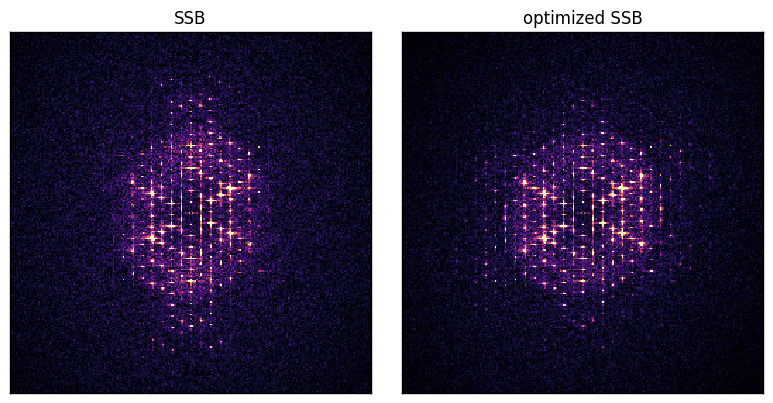

In [16]:
show_2d(
    [fft_recons[0],optimized_recon_fft],
    title=["SSB","optimized SSB"],
    axsize=(4,4),
    cmap='magma',
    upper_quantile=0.995,
        
)

In [17]:
print(f"Optimized aberration coefs: {direct_ptycho.aberration_coefs}")
print(f"Optimized rotation angle deg: {direct_ptycho.rotation_angle}")

Optimized aberration coefs: {'C10': -1052.510153977838, 'C12': 139.42045477536746, 'phi12': -0.5330638565505849}
Optimized rotation angle deg: 88.08010540392696


## Iterative ptychography

Now we transition from direct methods to gradient-based iterative reconstruction.

The direct-methods give a physically reasonable initialization (aberrations + rotation), which can improve iterative convergence.

Workflow below:

1. Adapt aberration parameters for multislice object geometry
2. Build `PtychographyDatasetRaster` and run COM-based preprocessing
3. Reconstruct with a pixelated model
4. Initialize DIP object/probe models from that solution and refine

In [18]:
NUM_PROBES = 1 # can do mixed state but doesnt add much
NUM_SLICES = 5 
SLICE_THICKNESS = 40 # A

In [19]:
# Direct-method defocus is referenced to a single effective plane.
# For multislice reconstruction we shift C10 by half the total object thickness
# so the probe is centered relative to the slice stack.
half_thickness = SLICE_THICKNESS * (NUM_SLICES - 1) / 2
optimized_aberration_coefs_iterative = direct_ptycho.aberration_coefs.copy()
optimized_aberration_coefs_iterative["C10"] -= half_thickness
optimized_aberration_coefs_iterative

{'C10': -1132.510153977838,
 'C12': 139.42045477536746,
 'phi12': -0.5330638565505849}

Calculating center of mass: 100%|██████████| 65536/65536 [00:01<00:00, 36148.61probe position/s]

Forcing best fit rotation to 94 degrees.
Forcing transpose of intensities to False.


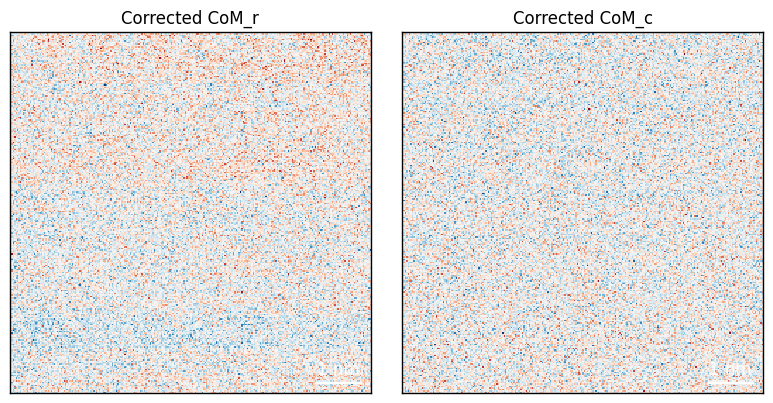

Normalizing intensities: 100%|██████████| 65536/65536 [00:36<00:00, 1819.36probe position/s]


In [20]:
pdset = PtychographyDatasetRaster.from_dataset4dstem(
    dset,
    learn_scan_positions=True, # helps for this dataset
    learn_descan=False,
)

pdset.preprocess(
    com_fit_function="constant",
    plot_rotation=True,
    plot_com=True,
    probe_energy=PROBE_ENERGY,
    force_com_rotation=94, # direct_ptycho.rotation_angle,
    force_com_transpose=False,
    vectorized=False,
)

### Pixelated reconstruction

We first perform the reconstruction with a conventional pixelated basis. 

This is usually more stable than jumping straight into DIP, and it provides a good initialization for both object and probe networks in the next stage.

In [21]:
obj_model_pix = ObjectPixelated.from_uniform(
    num_slices=NUM_SLICES,
    slice_thicknesses=SLICE_THICKNESS,
    obj_type='pure_phase',
)

opt_probe_params = {
    "energy": PROBE_ENERGY,
    "aberration_coefs": optimized_aberration_coefs_iterative,
    "semiangle_cutoff": PROBE_SEMIANGLE,
}

probe_model_pix = ProbePixelated.from_params(
    num_probes=NUM_PROBES,
    probe_params=opt_probe_params,
)

detector_model = DetectorPixelated()

ptycho_pix = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix,
    detector_model=detector_model,
)

# Extra padding reduces wrap-around/cropping artifacts during propagation.
ptycho_pix.preprocess(
    obj_padding_px=(32, 32),
    batch_size=128,
)

Iter 20/20, Loss: 3.901e+04: 100%|██████████| 20/20 [02:06<00:00,  6.31s/it]


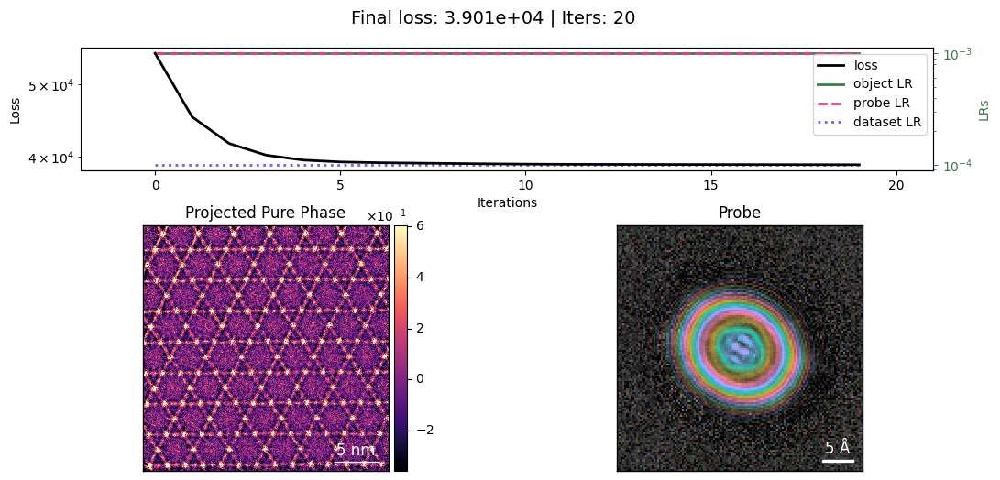

In [22]:
opt_params = {
        "object": OptimizerParams.AdamW(lr=1e-3),
        "probe": OptimizerParams.AdamW(lr=1e-3),
        "dataset": OptimizerParams.AdamW(lr=1e-4),
}

scheduler_params = {
    "object": SchedulerParams.Plateau(),
    "probe": SchedulerParams.Plateau(),
    "dataset": SchedulerParams.Plateau(),
}

ptycho_pix.reconstruct(
    num_iters=20,
    reset=True,
    device=config.get("device"),
    constraints={"object": PtychoObjConstraintParams.Raster(
        identical_slices=True,  # default for this is False
    ), "dataset": PtychoDatasetConstraintParams.Raster(
        center_scan_positions=True,  # keep the average scan position fixed
    )},
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    batch_size=128,
    store_snapshots_every=5,
).visualize(
)
# ~7.1 s/iter on our GPU

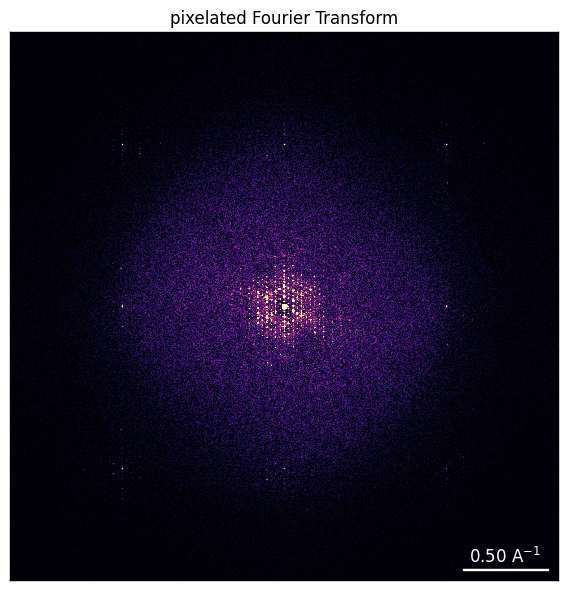

In [23]:
ptycho_pix.show_obj_fft(
    cmap="magma",
    upper_quantile=0.999,
    lower_quantile=0.01,
    title="pixelated",
    axsize=(6, 6),
)

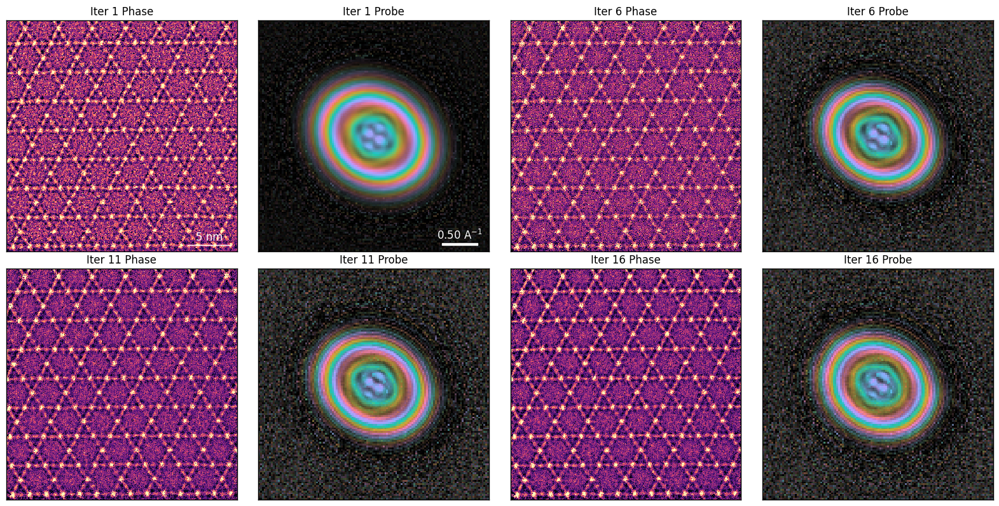

In [24]:
ptycho_pix.show_iters()

### Deep Image Prior (DIP) refinement

After obtaining a reasonable pixelated solution, we switch to CNN-parameterized object/probe models.

DIP regularizes the reconstruction through network structure and often improves robustness/noise behavior in low-dose settings, especially when initialized from a physically consistent pixelated result.

Iter 1/150, Loss: 1.640e+00, :   1%|          | 1/150 [00:00<00:18,  8.19it/s]

Iter 150/150, Loss: 1.810e-03, : 100%|██████████| 150/150 [00:02<00:00, 58.54it/s]


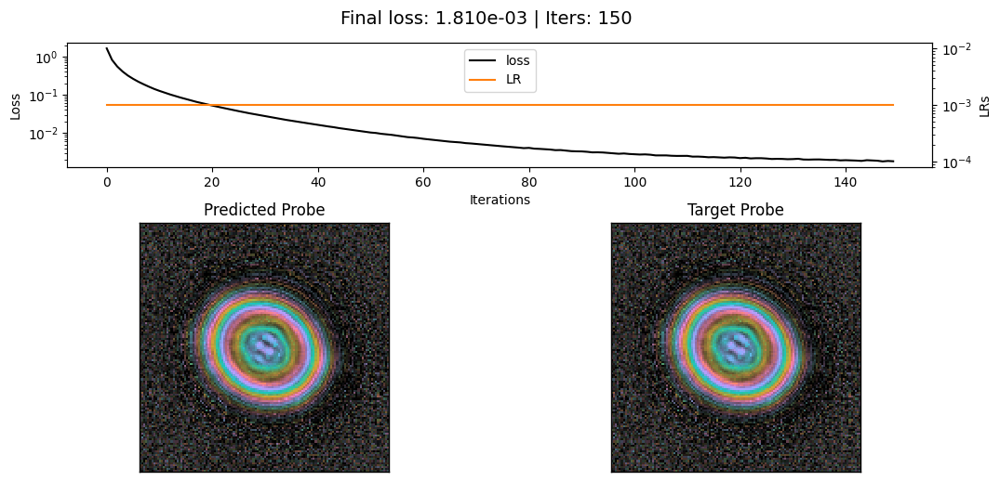

In [25]:
obj_dip = CNN2d(
    in_channels=NUM_SLICES,
    dtype=torch.float32,  # float32 for pure_phase/potential objects
    final_activation="identity",
)

obj_model_dip = ObjectDIP.from_pixelated(
    model=obj_dip,
    pixelated=ptycho_pix.obj_model,
    device=config.get("device"),
)

probe_dip = CNN2d(
    in_channels=ptycho_pix.num_probes,
    start_filters=16,
    # start_filters=32, #sometimes using a broader network helps 
    dtype=torch.complex64,
)

probe_model_dip = ProbeDIP.from_pixelated(
    model=probe_dip,
    pixelated=ptycho_pix.probe_model,
    device=config.get("device"),
)

pdset.learn_descan = False
pdset.learn_scan_positions = True # making sure scan positions are back on 

### Optional object pretraining can help on some datasets, but isn't necessary here.
# obj_model_dip.pretrain(
#     reset=True,
#     num_iters=50,
#     optimizer_params={
#         "type": torch.optim.Adam,
#         "lr": 1e-3,
#     },
#     scheduler_params={
#         "type": "plateau",
#         "factor": 0.5,
#     },
# )

probe_model_dip.pretrain(
    reset=True,
    num_iters=150,
    optimizer_params=OptimizerParams.Adam(lr=1e-3),
    scheduler_params=SchedulerParams.Plateau(factor=0.5),
    apply_constraints=False,
)

ptycho_dip = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_dip,
    probe_model=probe_model_dip,
    detector_model=detector_model,
    device="gpu",
)

ptycho_dip.preprocess(
    obj_padding_px=(32, 32),
)

Iter 10/10, Loss: 3.879e+04: 100%|██████████| 10/10 [05:41<00:00, 34.14s/it]


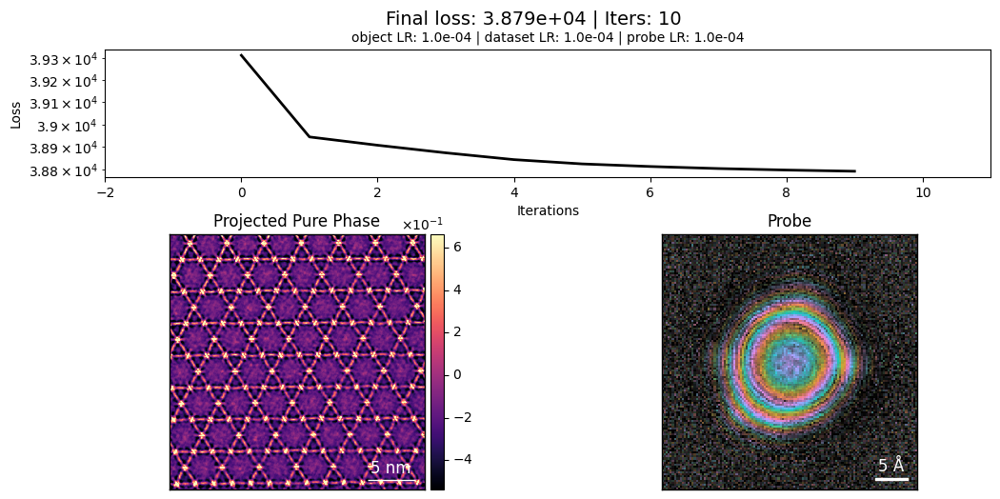

In [26]:
opt_params = {  
    "object": OptimizerParams.AdamW(lr=1e-4),
    "probe": OptimizerParams.AdamW(lr=1e-4),
    "dataset": OptimizerParams.AdamW(lr=1e-4),
}

scheduler_params = {
    "object": SchedulerParams.Plateau(),
    "probe": SchedulerParams.Plateau(),
    "dataset": SchedulerParams.Plateau(),
}
ptycho_dip.reconstruct(
    num_iters=10,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints={"object": PtychoObjConstraintParams.Raster(identical_slices=True)},
    batch_size=128,
    store_snapshots_every=1, 
).visualize()
# ~36.3 s/iter on our GPU

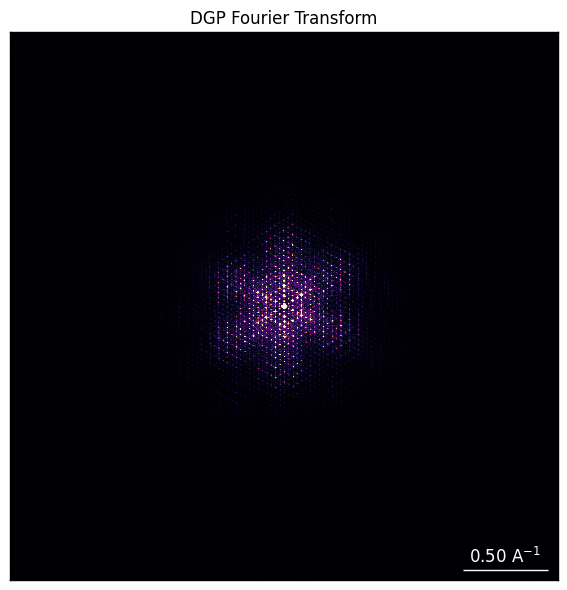

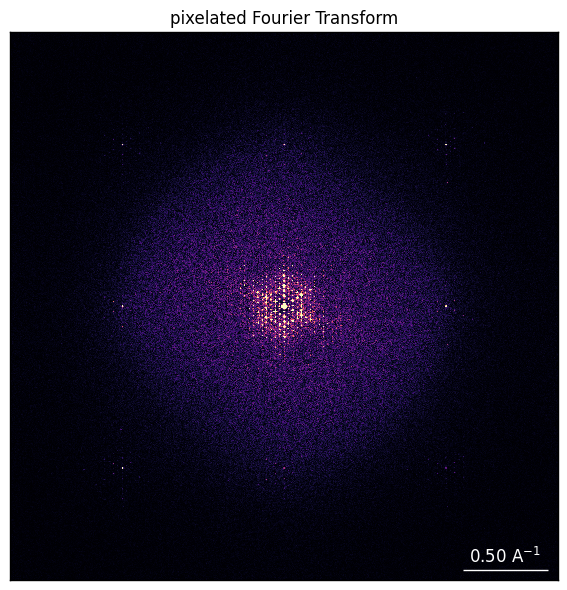

In [27]:
pad = (2048 - ptycho_dip.obj_cropped.shape[1]) // 2
dip_ff1 = ptycho_dip.show_obj_fft(
    cmap="magma",
    pad=pad,
    upper_quantile=0.999,
    lower_quantile=0.01,
    title="DGP",
    axsize=(6, 6),
    return_fft=True,
)
pix_ff1 = ptycho_pix.show_obj_fft(
    cmap="magma",
    pad=pad,
    upper_quantile=0.999,
    lower_quantile=0.01,
    title="pixelated",
    axsize=(6, 6),
    return_fft=True,
)


(<Figure size 1200x600 with 2 Axes>,
 array([<Axes: title={'center': 'pixelated'}>,
        <Axes: title={'center': 'DGP'}>], dtype=object))

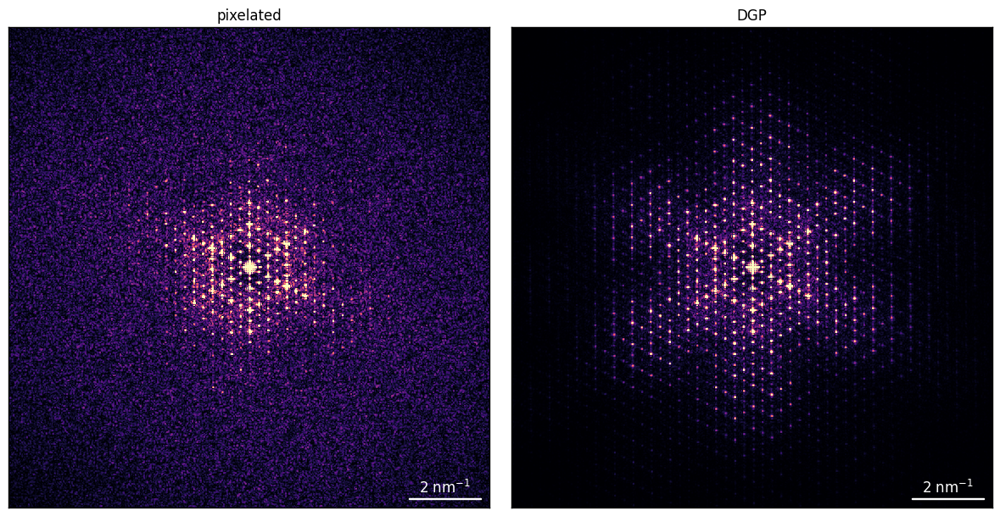

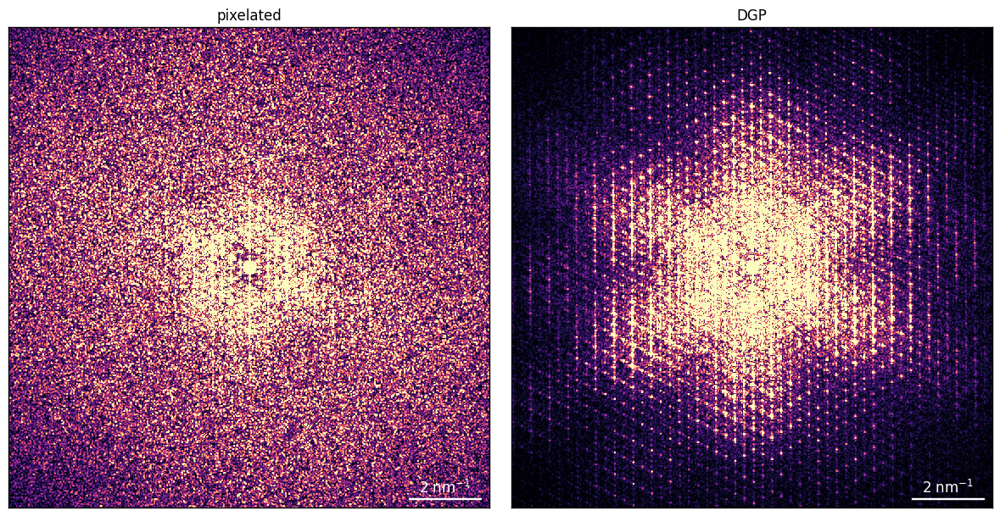

In [28]:
c = 600
fft_sampling = 1 / (ptycho_dip.sampling[0] * dip_ff1.shape[0])
show_2d(
    [
        np.abs(pix_ff1[c:-c,c:-c]),
        np.abs(dip_ff1[c:-c,c:-c]),
    ],
    cmap='magma',
    axsize=(6,6),
    upper_quantile=0.995,
    title=["pixelated", "DGP"],
    scalebar=[{"sampling": fft_sampling*10, "units": r"$\mathrm{nm^{-1}}$"}],
)
show_2d(
    [
        np.abs(pix_ff1[c:-c,c:-c]),
        np.abs(dip_ff1[c:-c,c:-c]),
    ],
    cmap='magma',
    axsize=(6,6),
    upper_quantile=0.9,
    title=["pixelated", "DGP"],
    scalebar=[{"sampling": fft_sampling*10, "units": r"$\mathrm{nm^{-1}}$"}],
)


(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

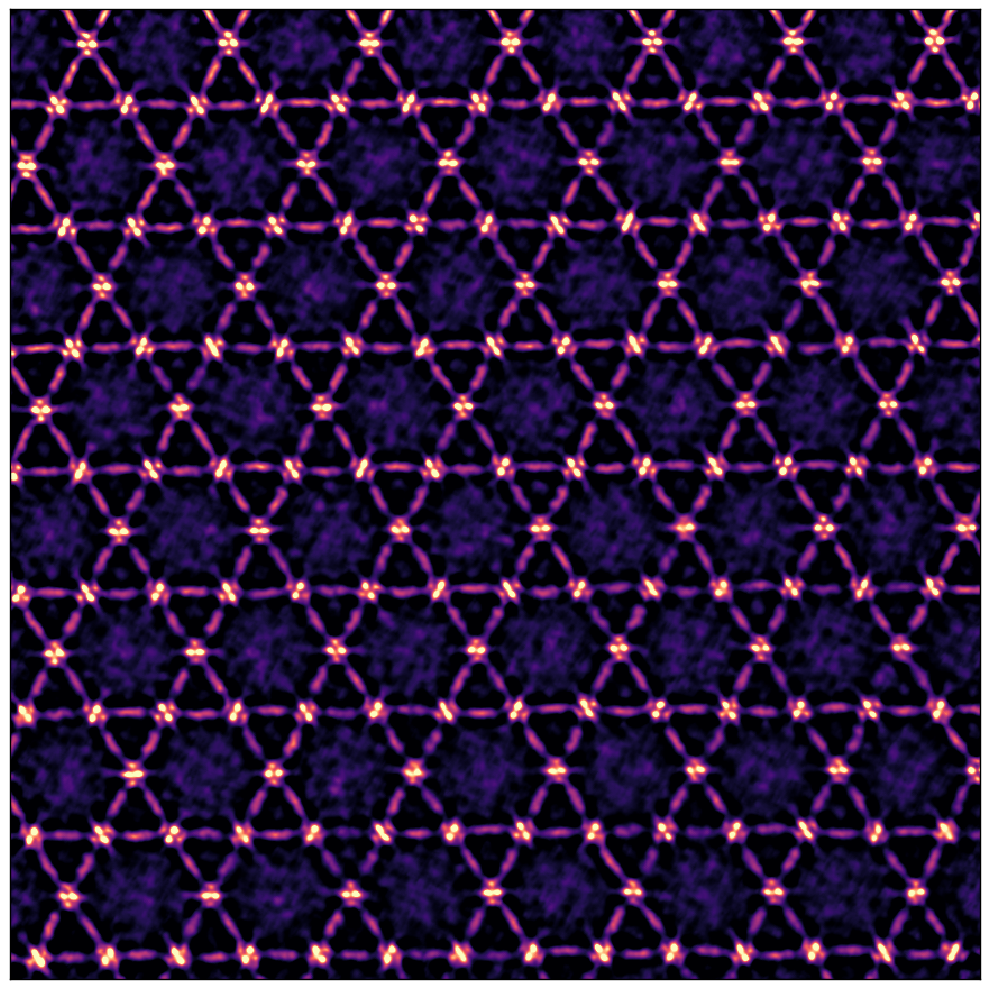

In [29]:
show_2d(
    [
        ptycho_dip.obj_cropped.sum(0),
    ],
    cmap='magma',
    axsize=(10,10),
    upper_quantile=0.99,
    lower_quantile=0.25,
)

### Save reconstruction outputs

Usually it is useful to save both:

1. the full quantEM reconstruction object (for later resume/inspection)
2. a lightweight `numpy` export of the cropped reconstructed object (for downstream analysis/plotting)

The next cell provides both options (commented by default).

In [ ]:
savedir = Path("../../outputs/diffractive_imaging")
savedir.mkdir(exist_ok=True)

# Save full reconstruction bundle (object/probe/dataset metadata + history)
ptycho_dip.save(savedir / "MOSS6_DGP.zip", mode="o")

# Save cropped object only for external processing
np.save(savedir / "MOSS6_DGP_obj_cropped.npy", ptycho_dip.obj_cropped)

Saving ptychography object to /home/amccray/code/quantem-tutorials/outputs/diffractive_imaging/MOSS6_DGP.zip


-- end notebook --